# Numerical Optimization Assignment 2
## Introduction
In this assignment, we expect you to be familiar with the Pytorch optimizer library. We are using the Rosenbrock function as the benchmark of our optimization algorithms again. Since this is a simple test on very small scale, CUDA is not needed. You need to install Pytorch to acquire the pre-defined optimizers.  
The library document link: https://pytorch.org/docs/stable/optim.html

## Task
1. (40%) Please try at least 4 different optimizers and observe the behavior of them, and try different hyperparameters and observe if they behave differently. (In case of L-BFGS, the parameters wrapped in this sample code won't work. If you want to try it anyway, you will need to write your own code.) Whether if your setting converges or not, please justify it by experiment or your hyperthesis.
2. (40%) Please write a concise report about your experiments and analysis. If you need to plot tables, please check the following link: https://www.tablesgenerator.com/markdown_tables
3. (20%) Please answer the following question in your report:  
    (a) What is the relation between SGD and GD(gradient descent) in our case, i.e. when the input is one-dimensional?  
    (b) Have you found effective way to set hyperparameters so they can iterate faster toward the minimum point?
4. Rename this notebook file by adding your student ID and upload it to eeclass platform. (ex. hw2_110xxxxxx.ipynb)

##  Advanced Technique: Learning rate scheduler
Another technique to find hyperparameter for learning rate is to perform scheduled adjestments of learning rate. This is called 'learning rate scheduler'. The adjestments here not only affected by current learning rate and momentum etc., but also the epoch number or step numbers. Usually, in these kind of method, we are presuming the optimal hyperparameters can be found by recognizing certain patterns, and we schedule the experiments to search the proper parameters in such manner. You can also apply these function in your code. The library document of learning rate scheduler is in the same link above.



In [2]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim

In [3]:
def rosenbrock(tensor):
    # since pytorch uses tensor, we don't use built-in function here
    x, y = tensor
    return (1 - x) ** 2 + 100 * (y - x ** 2) ** 2

def execute_steps(func, initial_state, optimizer_class, optimizer_config, num_iter=500):
    x = torch.Tensor(initial_state).requires_grad_(True)
    optimizer = optimizer_class([x], **optimizer_config)
    steps = []
    steps = np.zeros((2, num_iter))
    steps[:, 0] = np.array(initial_state)
    last_f = torch.tensor([100., 100.])
    for i in range(0, num_iter):
        optimizer.zero_grad()
        f = func(x)
        f.backward(create_graph=True, retain_graph=True)
        torch.nn.utils.clip_grad_norm_(x, 1.0)
        optimizer.step()
        steps[:, i] = x.detach().numpy()
    return steps

def plot_rosenbrok(grad_iter, optimizer_name):
    x = np.linspace(-2, 2, 250)
    y = np.linspace(-1, 3, 250)
    minimum = (1.0, 1.0)

    X, Y = np.meshgrid(x, y)
    Z = rosenbrock([X, Y])

    iter_x, iter_y = grad_iter[0, :], grad_iter[1, :]

    fig = plt.figure(figsize=(8, 8))

    ax = fig.add_subplot(1, 1, 1)
    ax.contour(X, Y, Z, 90, cmap='jet')
    ax.plot(iter_x, iter_y, color='r', marker='x')

    ax.set_title('{} with {} iterations'.format(optimizer_name, len(iter_x)))
    plt.plot(*minimum, 'gD')
    plt.plot(iter_x[-1], iter_y[-1], 'rD')
    plt.show()

In [4]:
def printX(steps):
    iter_x, iter_y = steps[0, :], steps[1, :]
    i=0
    for x,y in zip(iter_x,iter_y):
        print("iteration %d: [%.4f %.4f]" %(i,x,y))
        i+=1

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2, 'momentum':0.2, 'weight_decay':0.1},
        num_iter=5000,
    )

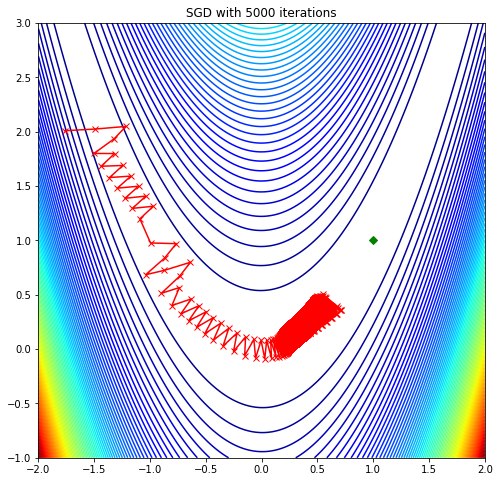

In [ ]:
plot_rosenbrok(steps, optimizer_class.__name__)

In [ ]:
printX(steps)

In [ ]:
print(steps[0,4999])
print(steps[1,4999])

0.451796293258667
0.42882949113845825


# **尋找最佳參數**

In [60]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.2*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': x, 'momentum':0.2, 'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_learning_rate = x
        
print('best_learning_rate=',best_learning_rate)

best_learning_rate= 0.002713711802440187


In [61]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
min = 50
for epoch in range(50):  
    x = 1*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': best_learning_rate, 'momentum':x, 'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_momentum = x
        
print('best_momentum=',best_momentum)

best_momentum= 0.9048374180359595


In [62]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.1*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': 0.002, 'momentum':0.1, 'weight_decay':x},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_weight_decay = x
        
print('best_weight_decay=',best_weight_decay)

best_weight_decay= 0.0007446583070924339


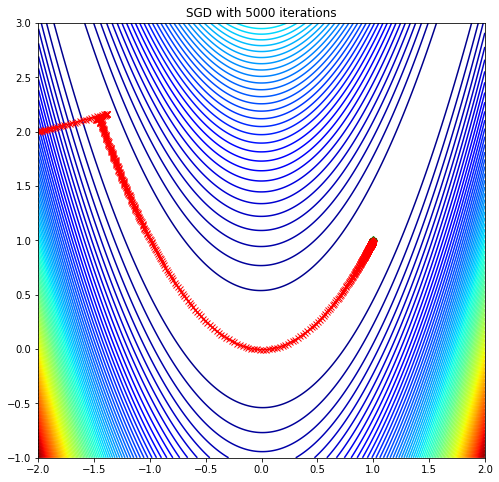

In [63]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':best_learning_rate,'momentum':best_momentum, 'weight_decay':best_weight_decay}, 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_class.__name__)

# **SGD 參數測試**

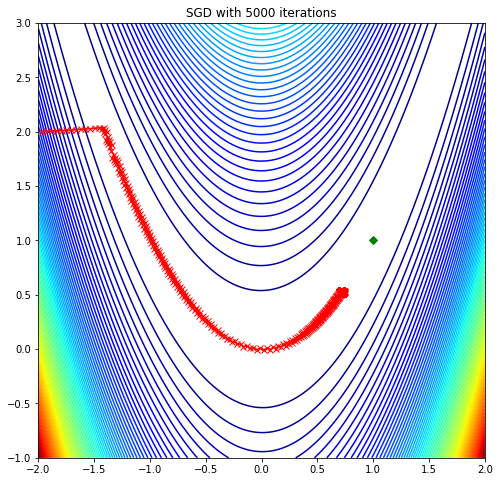

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1, 'momentum':0.2, 'weight_decay':0.1}, #更改learning rate 從 0.2 減為 0.1
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_class.__name__)

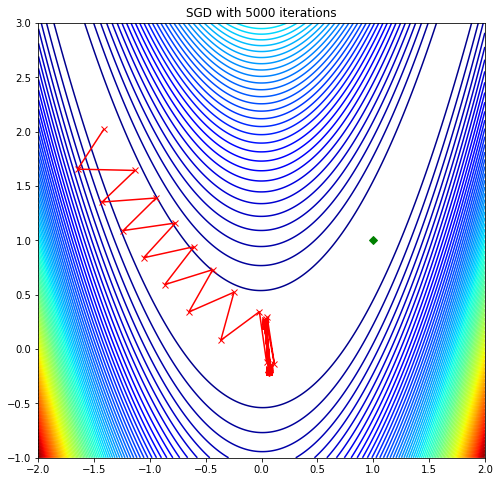

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.5, 'momentum':0.2, 'weight_decay':0.1}, #更改learning rate 從 0.2 增加為 0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_class.__name__)

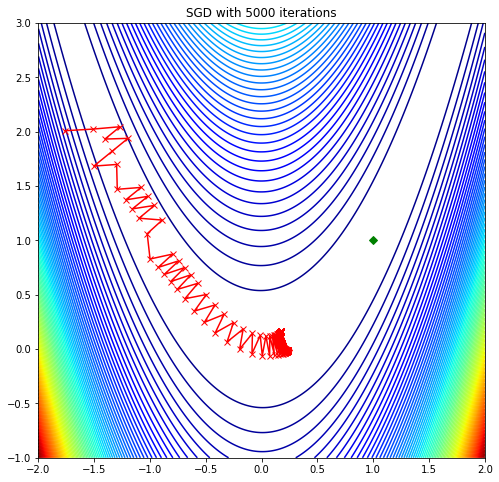

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2, 'momentum':0.1, 'weight_decay':0.1}, #更改 Momentum 從0.2 降低到 0.1 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_class.__name__)

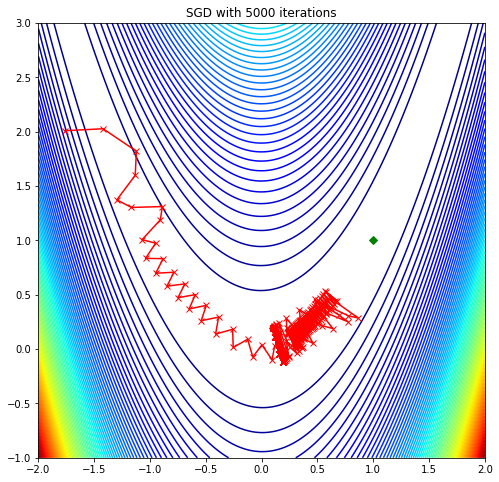

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2, 'momentum':0.5, 'weight_decay':0.1}, #更改 Momentum 從0.2 增加到 0.5 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_class.__name__)

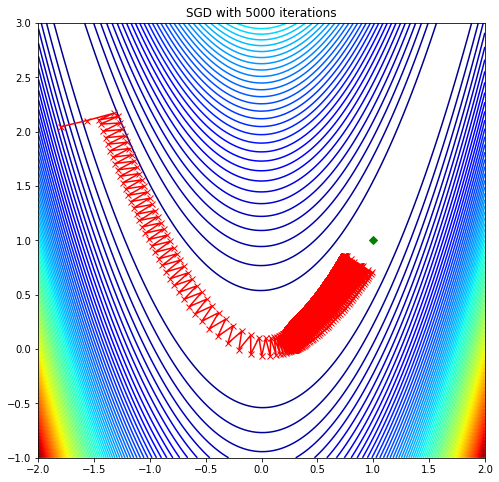

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2, 'momentum':0.2, 'weight_decay':0.01}, #更改 weight_decay 變為0.01
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_class.__name__)

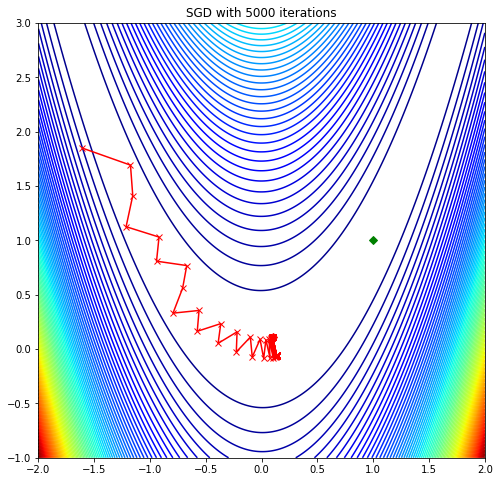

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_class = torch.optim.SGD
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_class,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2, 'momentum':0.2, 'weight_decay':0.5}, #更改 weight_decay 增加為0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_class.__name__)

# **優化器為 Adam**

# **尋找最佳參數**

In [64]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.2*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': x, 'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_learning_rate = x
        
print('best_learning_rate=',best_learning_rate)

best_learning_rate= 0.012162012525043592


In [65]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.1*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': best_learning_rate, 'weight_decay':x},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_weight_decay = x
        
print('best_weight_decay=',best_weight_decay)

best_weight_decay= 0.0007446583070924339


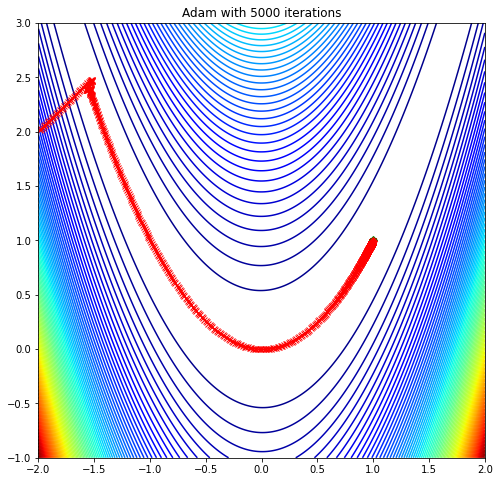

In [66]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':best_learning_rate, 'weight_decay':best_weight_decay},
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_adam.__name__)

# **Adam參數測試**

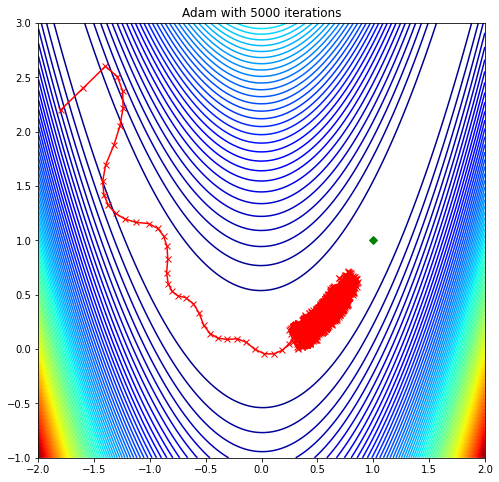

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2, 'weight_decay':0.1},
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_adam.__name__)

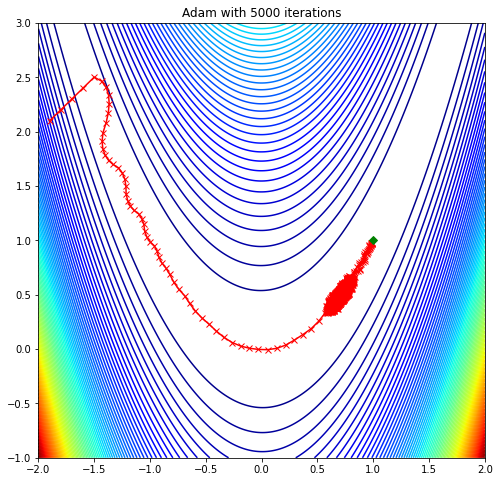

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1, 'weight_decay':0.1}, #learning rate 從 0.2 改為0.1
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_adam.__name__)

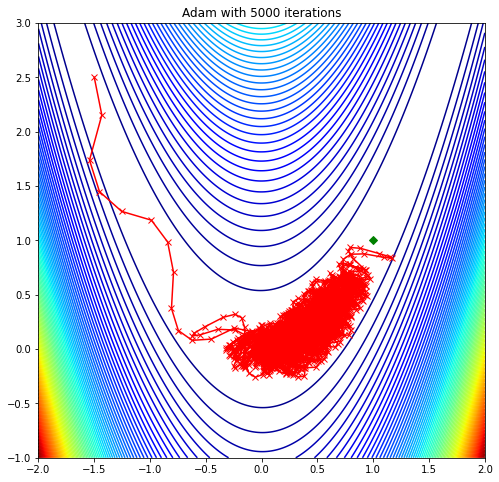

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.5, 'weight_decay':0.1}, #learning rate 從 0.2 改為0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_adam.__name__)

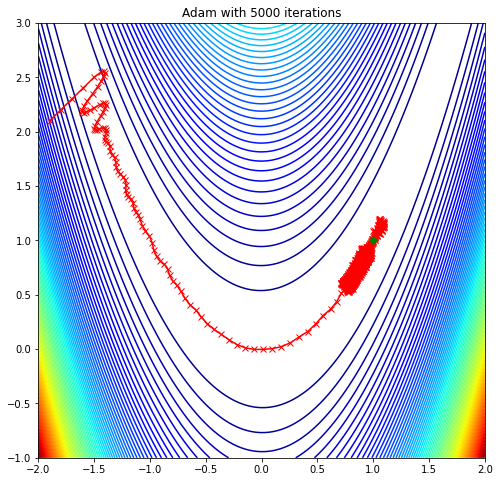

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1, 'weight_decay':0.01}, # weight_decay 從 0.1 改為0.01
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_adam.__name__)

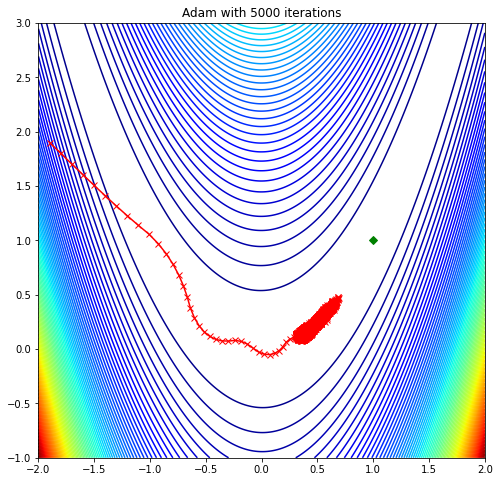

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_adam = torch.optim.Adam
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_adam,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1, 'weight_decay':0.5}, # weight_decay 從 0.1 改為0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_adam.__name__)

# **優化器為 Adadelta**

# **尋找最佳參數**

In [67]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.2*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': x,'eps':0.001,'rho':0.1,'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_learning_rate = x
        
print('best_learning_rate=',best_learning_rate)

best_learning_rate= 0.0024554679806136873


In [68]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.001*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': best_learning_rate,'eps':x,'rho':0.1,'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_eps = x
        
print('best_eps=',best_eps)

best_eps= 0.001


In [69]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.1*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':best_learning_rate,'eps':best_eps,'rho':x,'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_rho = x
        
print('best_rho=',best_rho)

best_rho= 0.05488116360940264


In [70]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.1*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': best_learning_rate,'eps':best_eps,'rho':best_rho,'weight_decay':x},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_weight_decay = x
        
print('best_weight_decay=',best_weight_decay)

best_weight_decay= 0.0007446583070924339


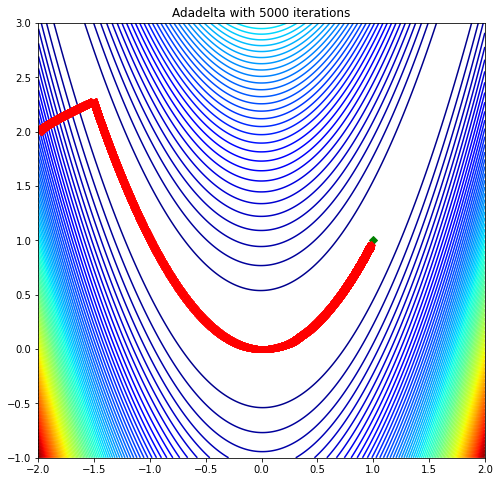

In [71]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': best_learning_rate,'eps':best_eps,'rho':best_rho,'weight_decay':best_weight_decay}, 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

# **Adadelta 參數測試**

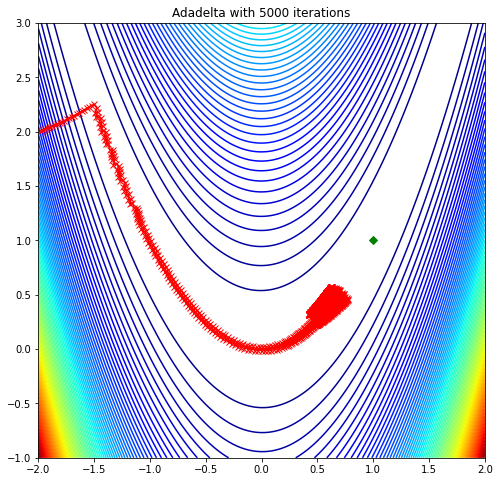

In [52]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2,'eps':0.001, 'weight_decay':0.1}, 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

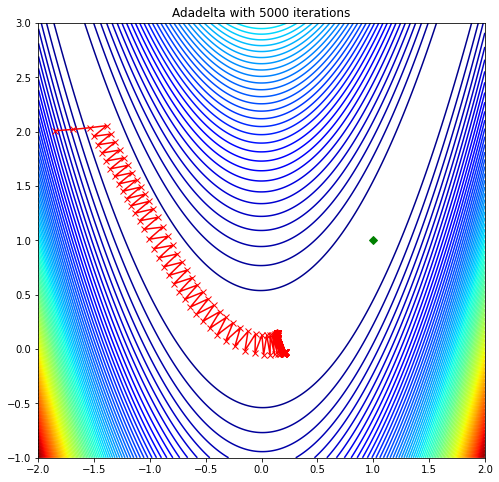

In [53]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2,'eps':0.1, 'weight_decay':0.1}, #更改 eps 從 0.001 減為 0.1
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

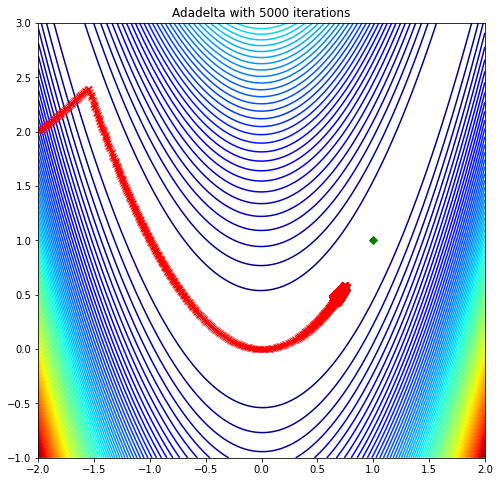

In [54]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2,'eps':0.0001, 'weight_decay':0.1}, #更改 eps 從 0.001 減為 0.0001
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

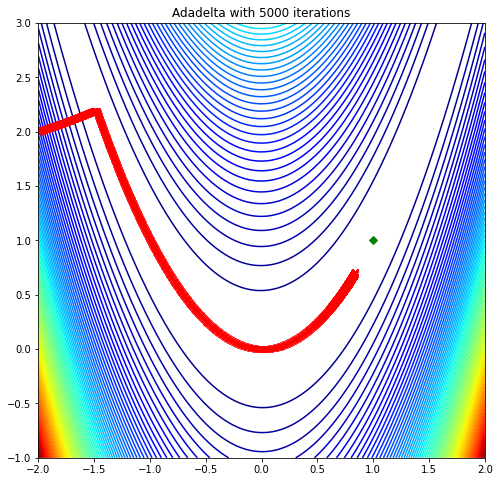

In [55]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.01,'eps':0.001, 'weight_decay':0.1}, #更改learning rate 從 0.2 減為 0.01
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

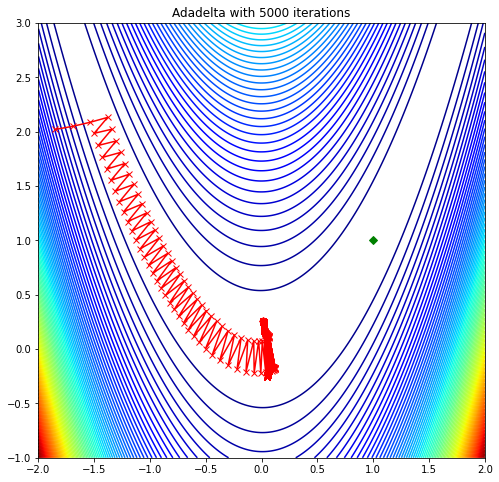

In [56]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.5,'eps':0.01, 'weight_decay':0.1}, #更改learning rate 從 0.2 減為 0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

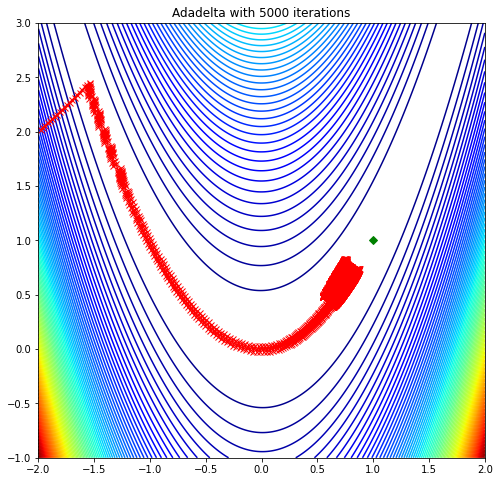

In [57]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2,'eps':0.001, 'weight_decay':0.01}, #更改 weight_decay 從 0.1 減為 0.01
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

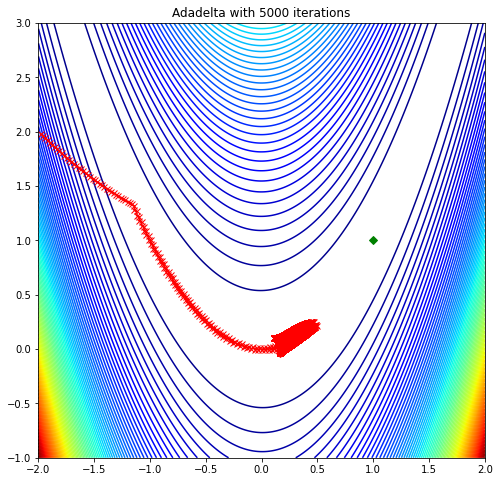

In [58]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_Adadelta = torch.optim.Adadelta
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_Adadelta,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.2,'eps':0.001, 'weight_decay':0.5}, #更改 weight_decay 從 0.1 減為 0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_Adadelta.__name__)

# **優化器為 RMSprop**

# **尋找最佳參數**

In [72]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.2*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': x,'alpha':0.9,'eps':0.01,'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_learning_rate = x
        
print('best_learning_rate=',best_learning_rate)

best_learning_rate= 0.0016459494098040048


In [ ]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.9*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': 0.0016459494098040048,'alpha':x,'eps':0.01,'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_alpha = x
        
print('best_alpha=',best_alpha)

In [7]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.01*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': 0.0016459494098040048,'alpha':best_alpha,'eps':x,'weight_decay':0.1},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_eps= x
        
print('best_eps=',best_eps)

best_eps= 0.0002024191144580438


In [8]:
initial_state = np.array([-2,2])  #tuning learning rate for SGD
# Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
min = 50
for epoch in range(50):  
    x = 0.1*np.exp(-0.1*epoch)
    steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.0016459494098040048,'alpha':best_alpha,'eps':best_eps,'weight_decay':x},
        num_iter=5000,
    )
    if ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5 < min: #判斷差距是否到最小
        min = ( (1-steps[0,4999]) ** 2 + (1-steps[1,4999]) ** 2 ) ** 0.5
        best_weight_decay= x
        
print('best_weight_decay=',best_weight_decay)

best_weight_decay= 0.0007446583070924339


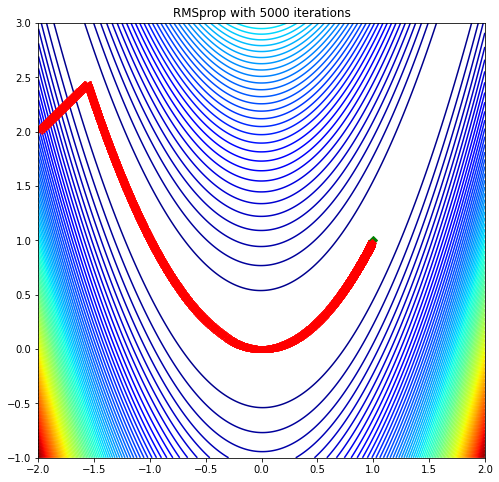

In [9]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr': 0.0016459494098040048,'alpha':best_alpha,'eps':best_eps,'weight_decay':best_weight_decay}, 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

# **RMSprop 參數測試**

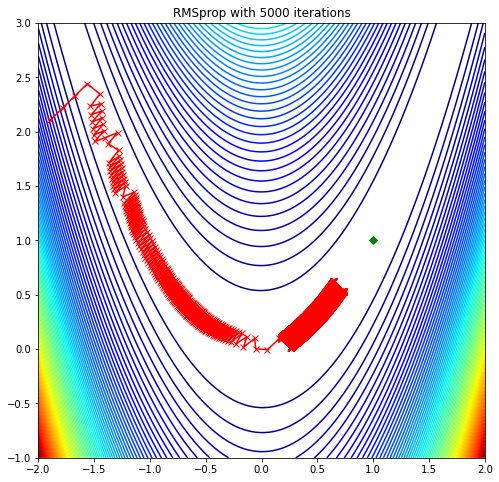

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1,'alpha':0.1,'weight_decay':0.1,'momentum':0.1}, 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

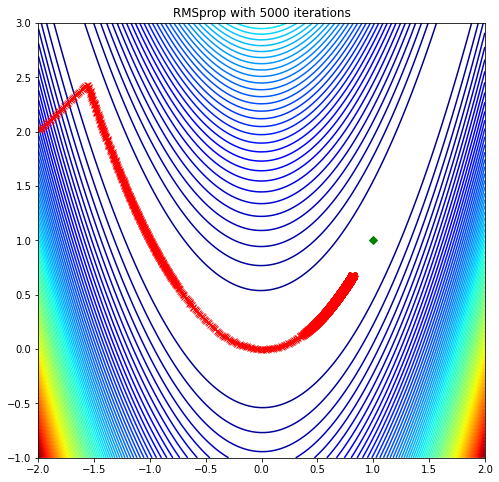

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.01,'alpha':0.1,'weight_decay':0.1,'momentum':0.1}, #更改 learning rate 從 0.1 變為 0.01 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

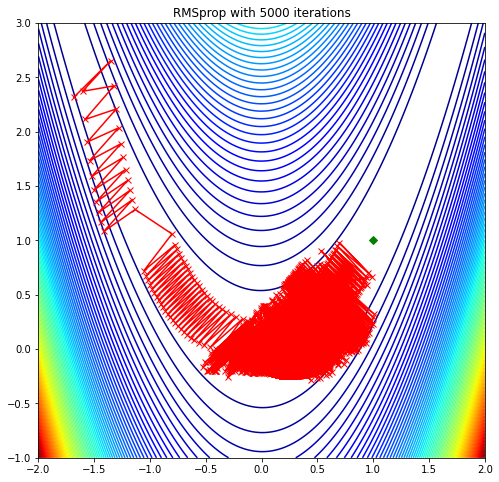

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.3,'alpha':0.1,'weight_decay':0.1,'momentum':0.1}, #更改 learning rate 從 0.1 變為 0.3 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

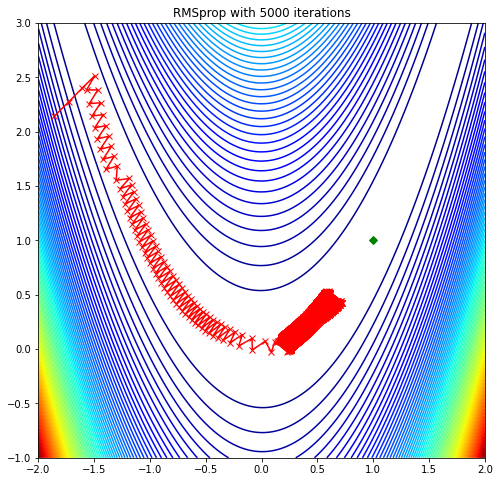

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1,'alpha':0.5,'weight_decay':0.1,'momentum':0.1}, #更改 alpha 從 0.1 變為 0.5 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

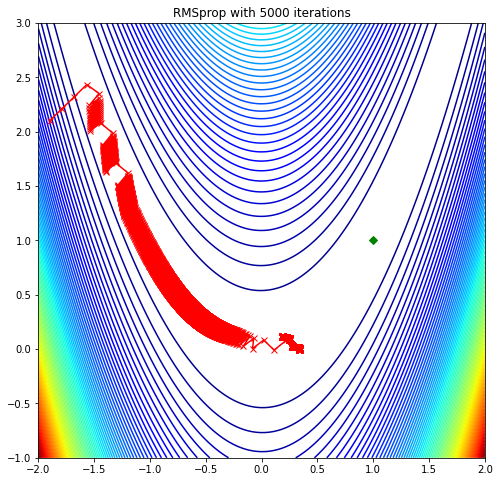

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1,'alpha':0.01,'weight_decay':0.1,'momentum':0.1}, #更改 alpha 從 0.1 變為 0.01 
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

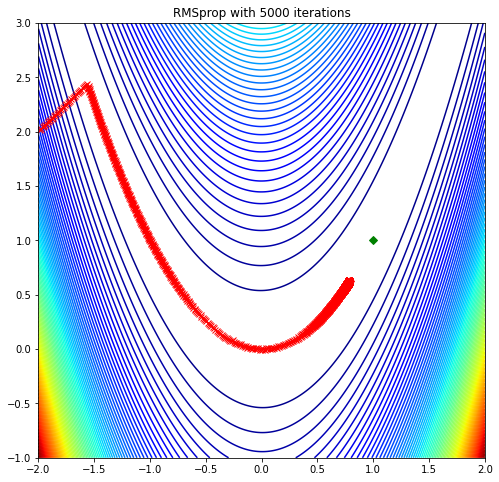

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.01,'alpha':0.5,'weight_decay':0.1,'momentum':0.1}, #更改 alpha 從 0.1 變為 0.5  learging rate =0.01
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

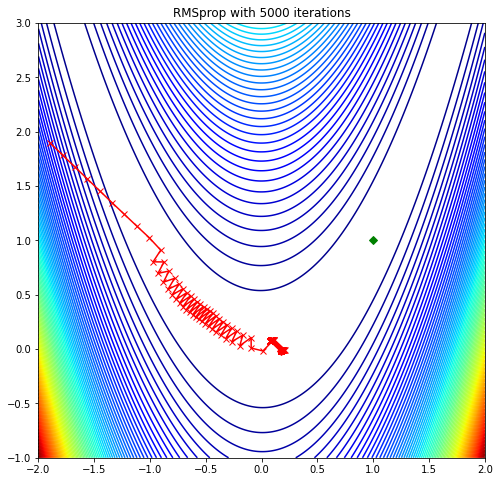

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1,'alpha':0.1,'weight_decay':0.5,'momentum':0.1}, #更改 weight_decay 從 0.1 變為 0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

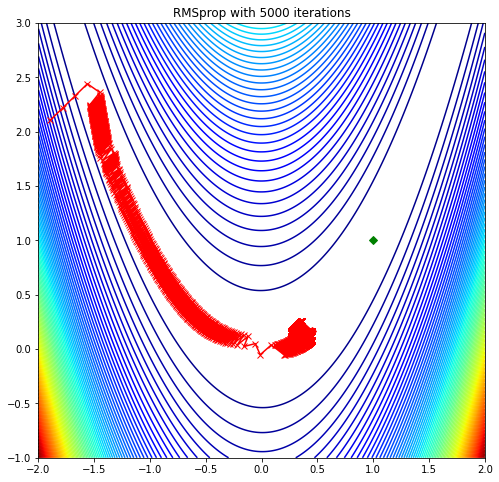

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1,'alpha':0.1,'weight_decay':0.01,'momentum':0.1},  #更改 weight_decay 從 0.1 變為 0.01
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

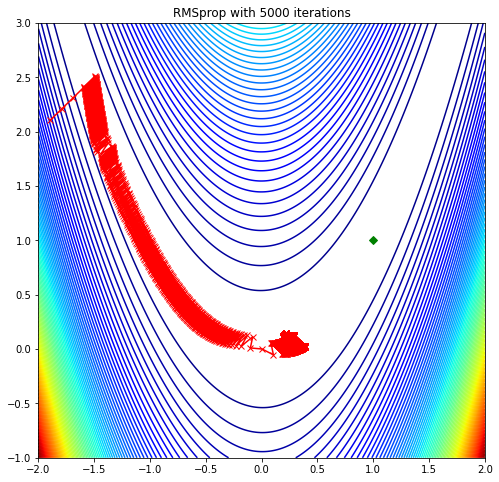

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1,'alpha':0.1,'weight_decay':0.01,'momentum':0.01},  #更改 momentum 從 0.1 變為 0.01
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

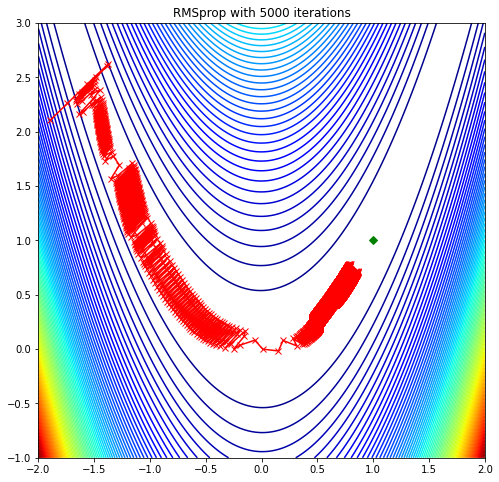

In [ ]:
initial_state = np.array([-2,2])
# TODO: Try other optimizers!
optimizer_RMSprop = torch.optim.RMSprop
tol=1e-2
steps = execute_steps(
        rosenbrock,
        initial_state,
        optimizer_RMSprop,
        # TODO: Try some different hyperparameters! Note that these parameters should be wraped in a dict().
        {'lr':0.1,'alpha':0.1,'weight_decay':0.01,'momentum':0.5},  #更改 momentum 從 0.1 變為 0.5
        num_iter=5000,
    )
plot_rosenbrok(steps, optimizer_RMSprop.__name__)

# **Report**

# **SGD 參數最佳設定**

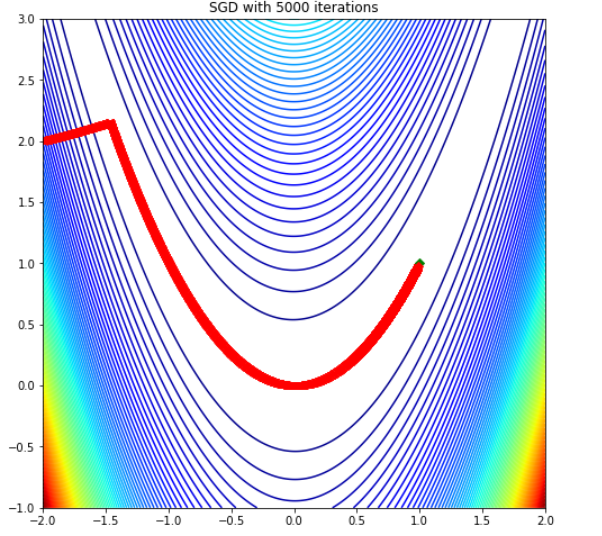

best_learning_rate= 0.002713711802440187, best_momentum= 0.9048374180359595, best_weight_decay= 0.0007446583070924339 

從圖示顯示收斂到最小值

# **Adam參數最佳設定**

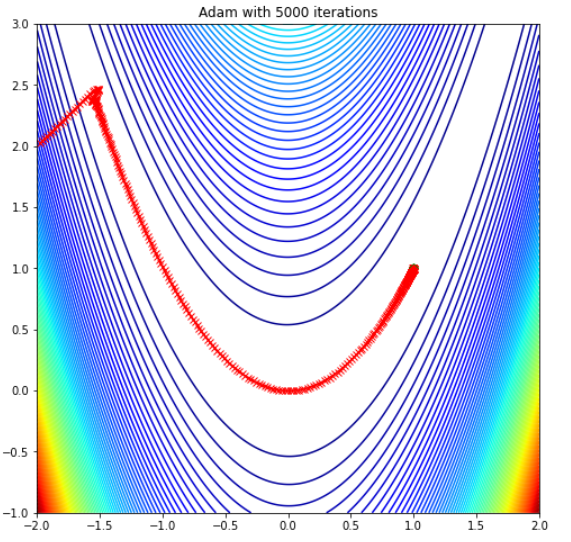


best_learning_rate= 0.012162012525043592, best_weight_decay= 0.0007446583070924339

從圖示顯示收斂到最小值

# **Adadelta 參數最佳設定**

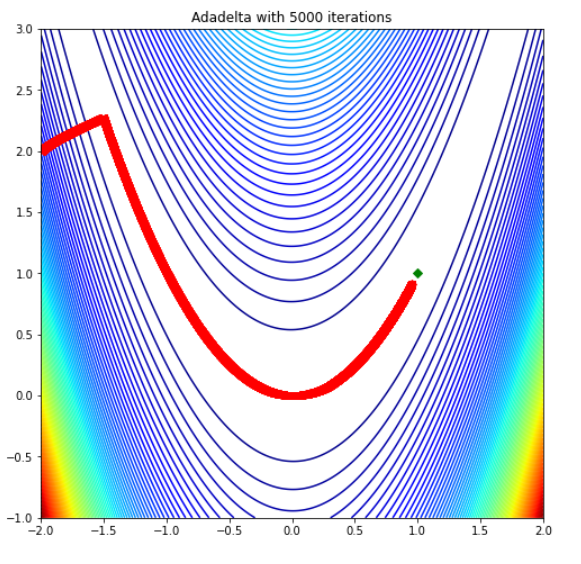

best_learning_rate= 0.0024554679806136873, best_eps=0.001, best_rho= 0.05488116360940264, best_weight_decay= 0.0007446583070924339

從圖示顯示收斂到最小值

# **RMSprop 參數最佳設定**

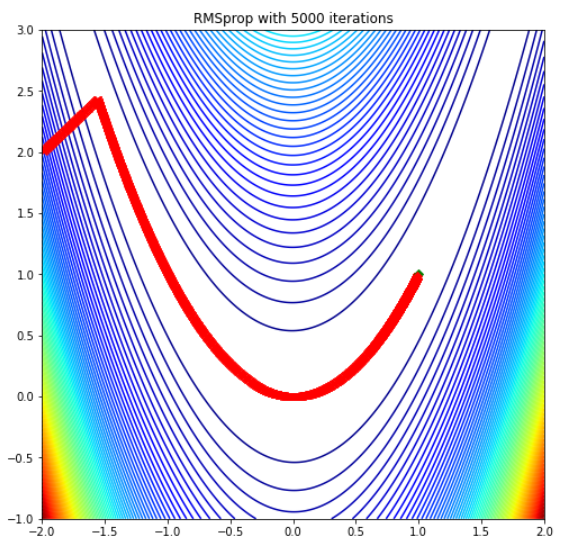


best_learning_rate= 0.0016459494098040048, best_eps= 0.0002024191144580438, best_alpha=0.9, best_weight_decay= 0.0007446583070924339

從圖示顯示收斂到最小值

# **分析各個參數的影響**

# **SGD參數影響**

# **learning rate**

如果learning rate太大，容易造成參數更新呈現鋸齒狀的更新，這是很沒有效率的更新路徑；但是learning rate太小，每次更新步伐太小，更新速度太慢。

# **weight decay**

weight decay的使用不是為了提高收斂精準度，也不是為了提高收斂速度，最終目的是為了防止過度擬合。在損失函数中，weight decay是放在regularization前面的一個係數，regularization一般指示模型的複雜度，所以weight decay的作用是調節模型複雜度對損失函数的影響，如果weight decay很大，則複雜的模型損失函数的值也就很大。

# **momentum**

momentum主要是用在計算參數更新方向前會考慮前一次參數更新的方向，如果當下梯度方向和歷史參數更新的方向一致，則會增強這個方向的梯度，若當下梯度方向和歷史參數更新的方向不一致，則梯度會衰退。然後每一次對梯度作方向微調。這樣可以增加學習上的穩定性(梯度不更新太快)，這樣可以學習的更快，並且有擺脫局部最佳解的能力。



# **RMSprop 參數影響**

# **$\alpha$**

在同一個維度上，學習率都有可能必須要能夠快速的反應、變動，所以在學習率調整上面多了一個參數$\alpha$，可以在新舊梯度上面做調節

$$\omega_{i}^{t+1}\longleftarrow\omega_{i}^{t+1}-\frac{\eta}{\sigma^{t}}g^{t}$$ where $$g^{t}=\frac{\partial L}{\partial \omega_{i}}(W^{t})\quad and \quad \sigma^{t} = \sqrt{\alpha(\sigma^{t-1})^2+(1-\alpha)(g^{t})^2+\epsilon}$$

若 $\alpha$上調，便對於舊的梯度有更大的佔比，也就是說在整個調節的過程中較傾向相信舊梯度帶給我們的資訊。

# **各個優化器的優缺點:**

# **SGD:**

就是最單純的gradient decent 方法，找出參數的梯度(利用微分的方法)，往梯度的方向去更新參數(weight)。但是存在的缺陷是，只有當自變量是一個维度的时候，它的前進方向才是真正梯度下降的方向。當存在多維變量時，如果某一維度的梯度過大，會使得下降方向在該梯度方向的分量過大，偏離了真正的軌道。

優點：針對大數據集，訓練速度很快。從訓練集樣本中隨機選取一個batch計算一次梯度，更新一次模型參數。

缺點：

1. 選擇適當的初始learning rate很困難。

2. 學習率調整策略受限於預先指定的調整規則。

3. 相同的學習率被應用於各個參數。

4. 容易收斂到局部最優解

# **Adam:**

是兩者合併加強版本(Momentum+RMSprop+各自做偏差的修正)

優點: 收斂速度快、調參數容易。


缺點:
1. 泛化問題，如果我們找到的minimum是sharp的，就很容易造成相當大的誤差。，Adam的training時確實收斂速度快，但在testing時造成的誤差卻都比training時差上許多。
2. 收斂問題，在某些情況會無法收斂。

# **Adadelta:**

Adagrad的改良版，為了解決Adagrad學習率衰減的問題，且不需要設定學習率。
訓練前期加速很快，後期可能會在局部最小值徘徊。

這種方法只有使用一階導數信息，具有良好的動態適應性，並且和原始隨機梯度下降算法相比具有更小的計算開銷。這種方法不需要人工調整學習率而且对不同模型结構、不同的數據模式以及超參數的選擇表現出較强的鲁棒性。

# **RMSprop :**

一種自適應學習率的優化器，這個優化器也是為了解決Adagrad學習率衰減的問題而產生。

優點:
1. 有效改善 Adagrad 提前結束訓練的問題。
2. 適合處理複雜的、non-convex 的 error surface。

缺點:
1. 仍然需要先設置一個全局學習率 



# **(a) What is the relation between SGD and GD(gradient descent) in our case, i.e. when the input is one-dimensional?**



# **ANS:**

gradient descent是一次用全部訓練集的數據去計算損失函數的梯度就更新一次參數。

SGD就是一次跑一個樣本或是小批次(mini-batch)樣本然後算出一次梯度或是小批次梯度的平均後就更新一次，那這個樣本或是小批次的樣本是隨機抽取的，所以才會稱為隨機梯度下降法。

# **(b) Have you found effective way to set hyperparameters so they can iterate faster toward the minimum point?**

# **ANS:**

參考Learning Rate Schedules基於指數衰減和learning rate decay，learning rate decay越小，學習率衰減的越慢，如果learning rate decay=0，學習率保持不變；learning rate decay越大，學習率衰減的越快，如果learning rate decay=1時，學習率衰減的最快。

$$learning\quad rate = initial\quad learning\quad rate * exp（-k * t）$$

而我learning rate decay選擇0.1，並讓參數數值隨著訓練輪次epoch逐漸下降，通常整個變化趨勢是指數形勢，到達最佳點(1,1)，從learning rate等每個參數都測試一次，找到每個參數的最佳值。